In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!cp -r /content/drive/MyDrive/avito/project/auto-10k .

In [ ]:
import matplotlib.pyplot as plt
import shutil 
import requests
import pandas as pd
import os
import seaborn as sns

In [ ]:
IMAGES_DIR = 'auto-10k'
ANNOTATIONS_FILE = '/content/drive/MyDrive/avito/project/aggregated_results_by_ds__pool_38456668__2023_04_03.tsv'
RAW_URLS_FILE = '/content/drive/MyDrive/avito/project/raw_urls.csv'

In [ ]:
annot = pd.read_csv(ANNOTATIONS_FILE, sep='\t')
raw_urls = pd.read_csv(RAW_URLS_FILE, sep=';')

In [ ]:
annot.head(10)

,INPUT:image,OUTPUT:result,CONFIDENCE:result,Unnamed: 3
0,https://drive.google.com/uc?id=1WkGuHARejVFCXu...,1,96.72%,NaN
1,https://drive.google.com/uc?id=1b88BofRfjwhYMj...,3,99.98%,NaN
2,https://drive.google.com/uc?id=1z2EB6yDComE_pu...,1,99.99%,NaN
3,https://drive.google.com/uc?id=1j7Kz6ck9NNXJVR...,7,96.40%,NaN
4,https://drive.google.com/uc?id=14b3MIN6iCUJ37_...,5,99.99%,NaN
5,https://drive.google.com/uc?id=1QhtVo2LmXQjhnX...,7,96.40%,NaN
6,https://drive.google.com/uc?id=1uyxHMwkK2aZr08...,6,99.99%,NaN
7,https://drive.google.com/uc?id=19TJcsClB6jcnra...,4,99.99%,NaN
8,https://drive.google.com/uc?id=1n46GlADrPiqTWU...,6,99.99%,NaN
9,https://drive.google.com/uc?id=1fHaH19FctOGlCr...,1,99.99%,NaN


In [ ]:
raw_urls.head(10)

,INPUT:image,image_name
0,https://drive.google.com/uc?id=1DmJX3NZiwHv0xB...,16755467472.jpg
1,https://drive.google.com/uc?id=1ON1htqMSlh8IEn...,16439693736.jpg
2,https://drive.google.com/uc?id=1kJmCY-hZhpKR1B...,15249446025.jpg
3,https://drive.google.com/uc?id=19rY9ZIRcl3D_Yp...,16881926827.jpg
4,https://drive.google.com/uc?id=1MPnl6ngTZDoXfU...,16375595098.jpg
5,https://drive.google.com/uc?id=1WCznEpasvp3wOH...,16468755290.jpg
6,https://drive.google.com/uc?id=1aTUwuoWh1TGvWh...,16513573119.jpg
7,https://drive.google.com/uc?id=1wo1_kefa0NPFH-...,16676029209.jpg
8,https://drive.google.com/uc?id=1hriwC8YMo_u4WZ...,16846373642.jpg
9,https://drive.google.com/uc?id=1HD48iqbeFC41_k...,16075846012.jpg


In [ ]:
annot = pd.merge(raw_urls, annot, on='INPUT:image')

In [ ]:
annot['OUTPUT:result'].value_counts()

 1    430
 5    213
 7    142
 3     62
 4     54
 6     33
 2     22
-1      1
Name: OUTPUT:result, dtype: int64

In [ ]:
def display_image(url, label):
    
    
    r = requests.get(url, stream=True)
    
    with open('hui.jpg', 'wb') as f:
        r.raw.decode_content = True
        shutil.copyfileobj(r.raw, f)
    
    plt.figure(figsize=(15, 7))
    plt.imshow(plt.imread('hui.jpg'))
    plt.title(label)
    plt.show()

In [ ]:
mapping = [{
              "label": "Стандартный",
              "value": "1"
          },
          {
              "value": "2",
              "label": "Открытые двери"
          },
          {
              "label": "Вид сбоку",
              "value": "3"
          },
          {
              "label": "Вид сзади",
              "value": "4"
          },
          {
              "label": "Вид спереди",
              "value": "5"
          },
          {
              "label": "Нет машины",
              "value": "6"
          },
          {
              "label": "другое",
              "value": "7"
          },
          {
              "label": "Не загрузилось фото",
              "value": "-1"
          }]

In [ ]:
mapping = {int(el['value']): el['label'] for el in mapping}

In [ ]:
annot['labels'] = annot['OUTPUT:result'].map(mapping) 
annot['labels'].value_counts()

Стандартный            430
Вид спереди            213
другое                 142
Вид сбоку               62
Вид сзади               54
Нет машины              33
Открытые двери          22
Не загрузилось фото      1
Name: labels, dtype: int64

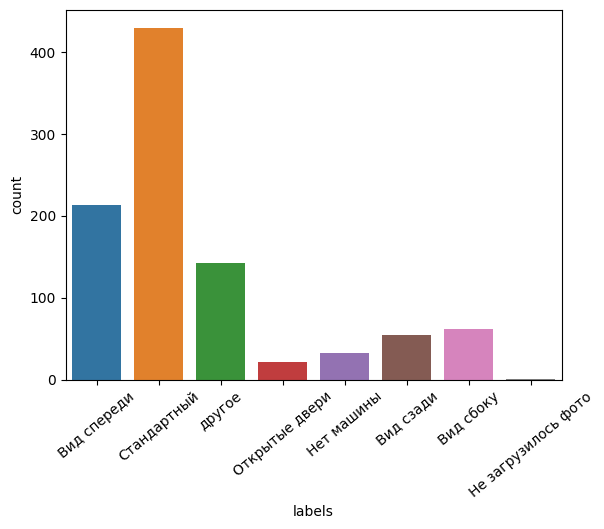

In [ ]:
sns.countplot(x=annot['labels'])
_ = plt.xticks(rotation=40)

In [ ]:
annot['image_name'] = annot['image_name'].map(lambda file: os.path.join(IMAGES_DIR, file))

In [ ]:
def plot_samples(annot, label, nrows=3, ncols=4):

    images = annot[annot['labels'] == label].sample(nrows*ncols)['image_name']

    f, axes = plt.subplots(nrows=nrows, ncols=ncols, )
    f.set_figheight(12)
    f.set_figwidth(16)
    f.suptitle(label)

    for image, ax in zip(images, axes.flatten()):
        
         image_arr = plt.imread(image)
         ax.imshow(image_arr, cmap='gray')
         ax.axis('off')

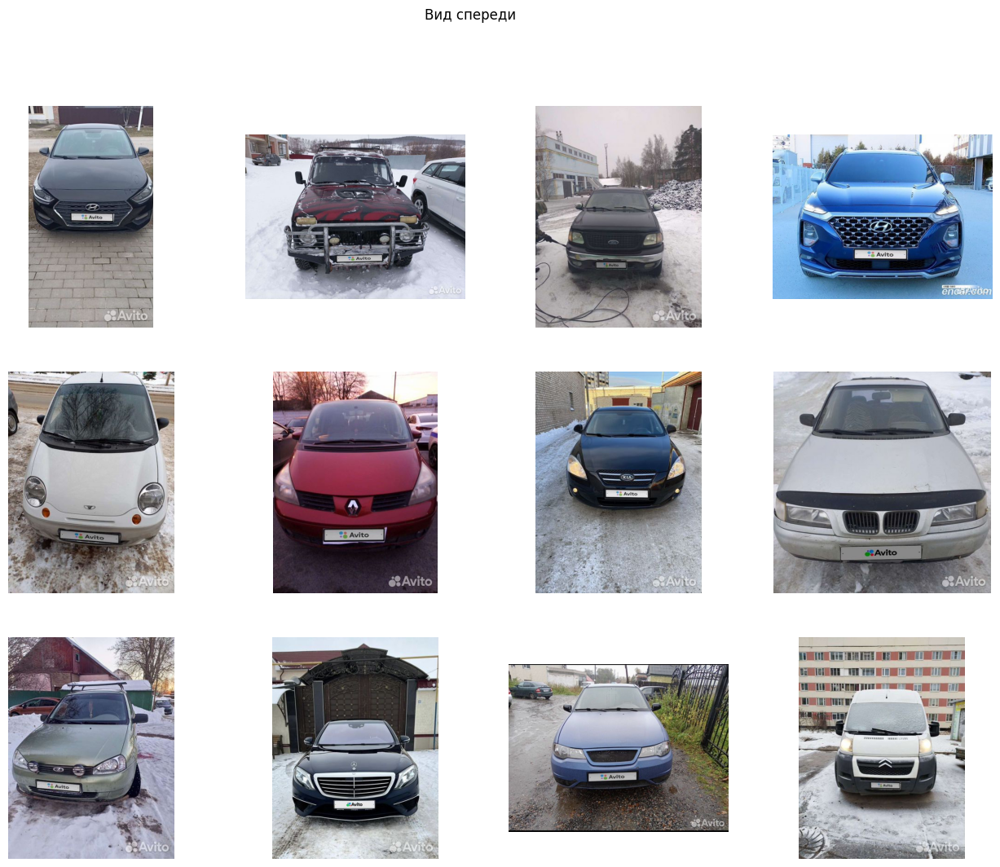

In [ ]:
plot_samples(annot, 'Вид спереди')

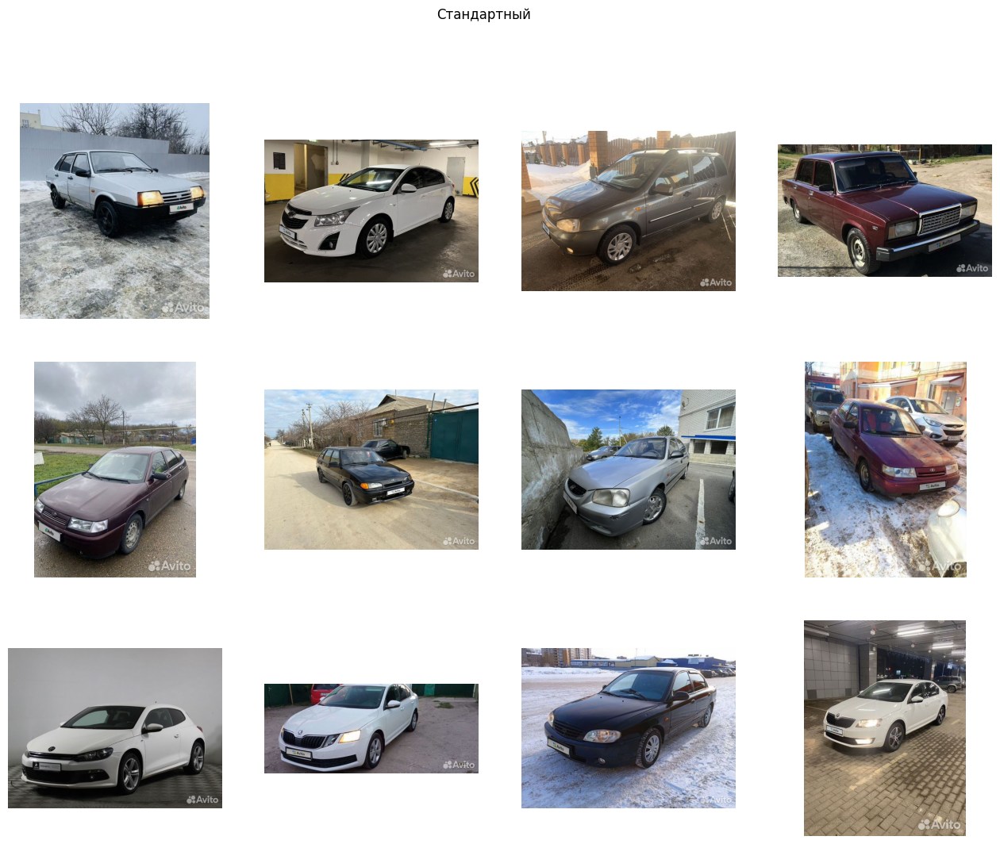

In [ ]:
plot_samples(annot, 'Стандартный')

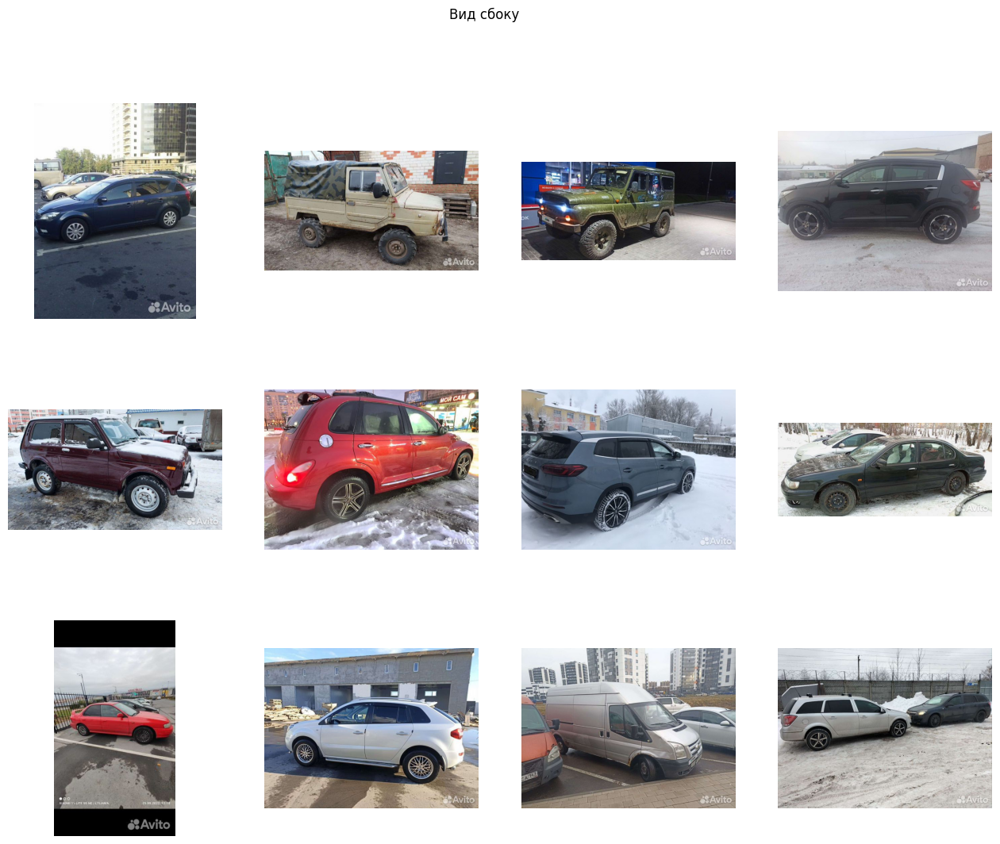

In [ ]:
plot_samples(annot, 'Вид сбоку')

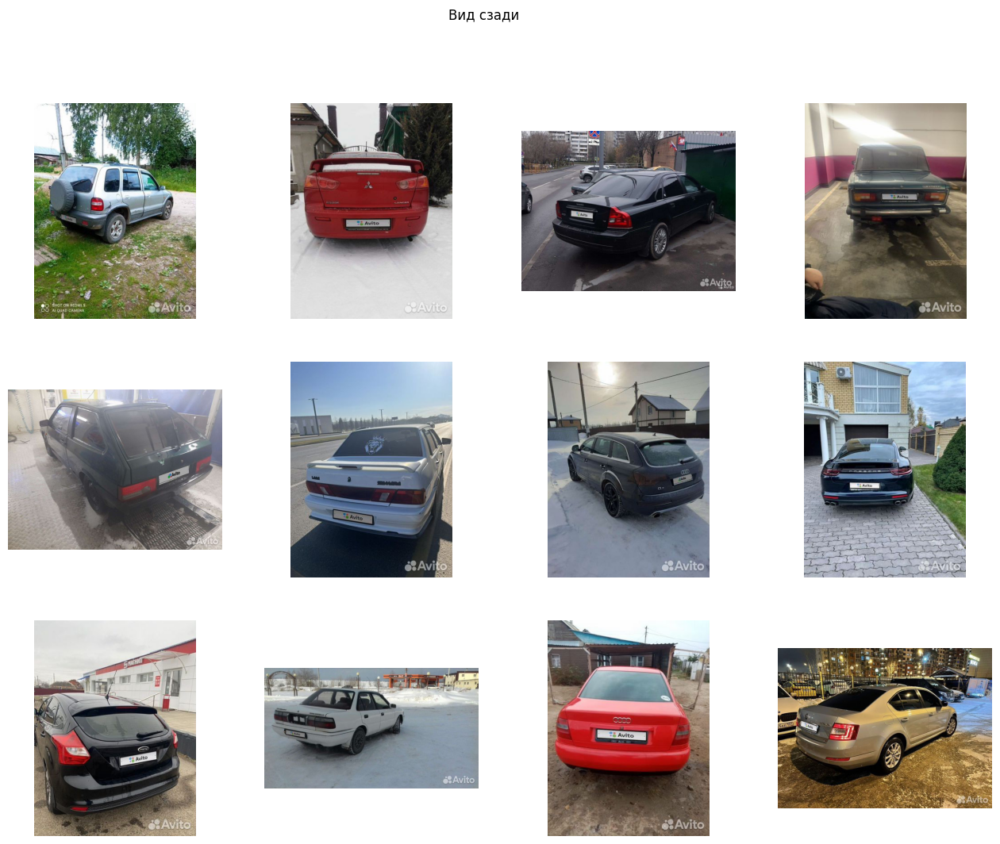

In [ ]:
plot_samples(annot, 'Вид сзади')

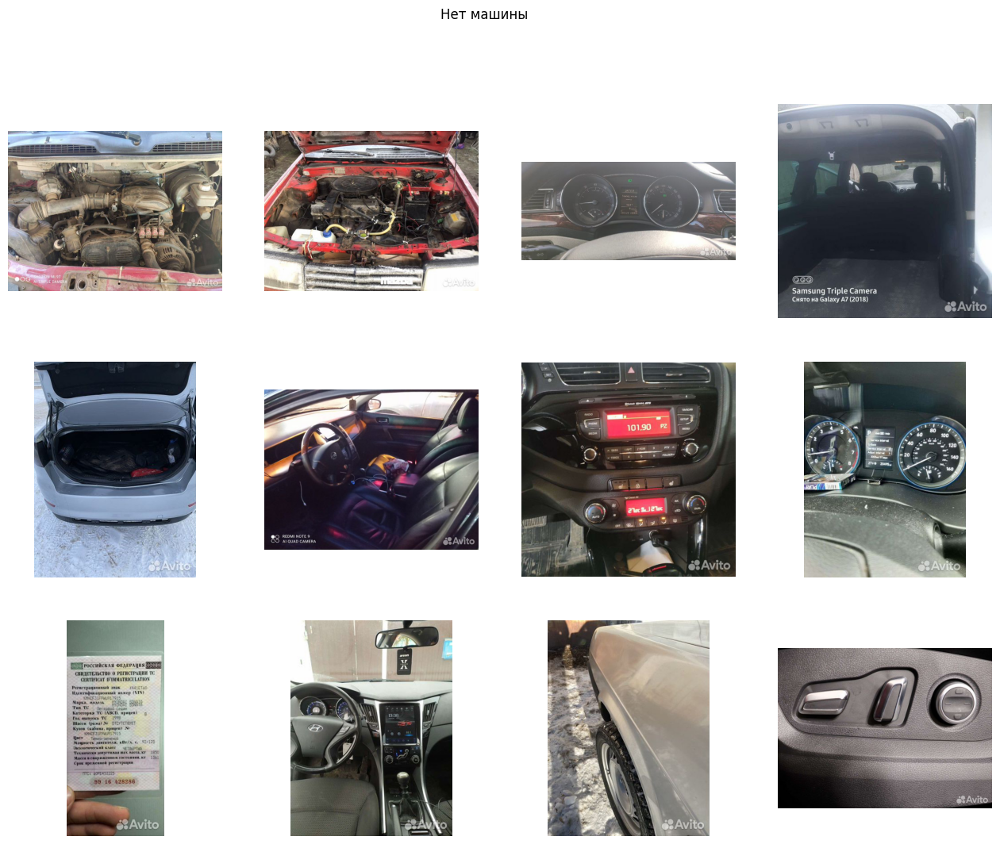

In [ ]:
plot_samples(annot, 'Нет машины')

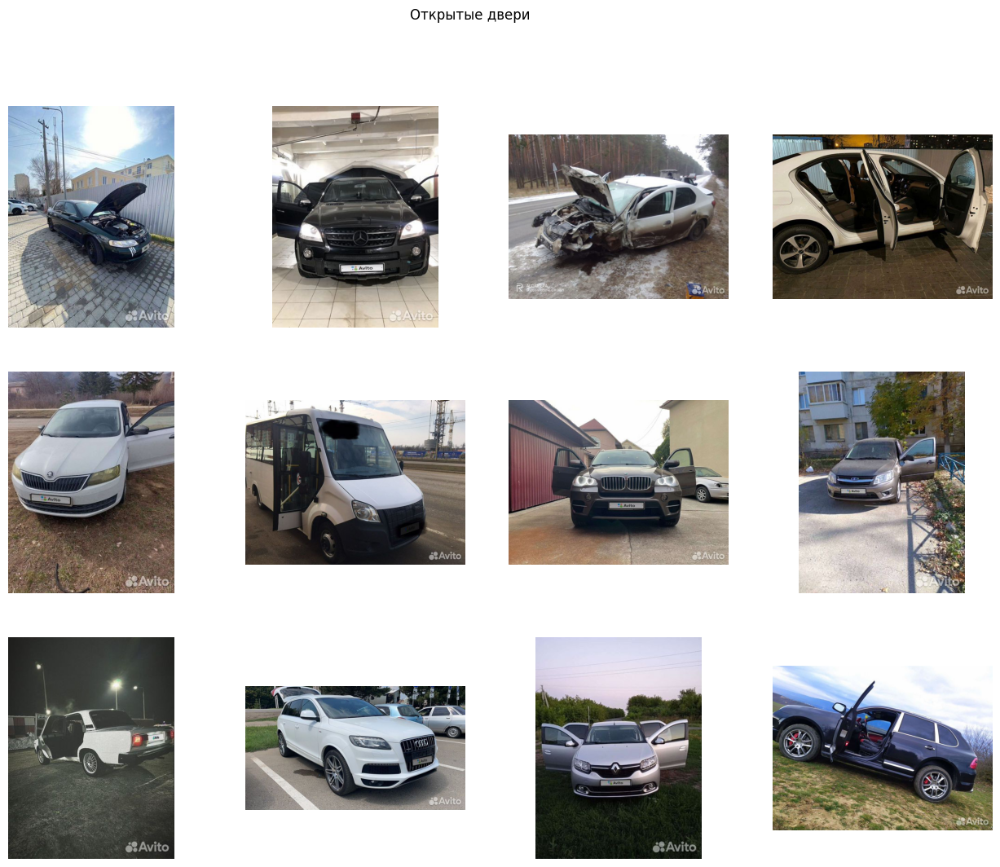

In [ ]:
plot_samples(annot, 'Открытые двери')

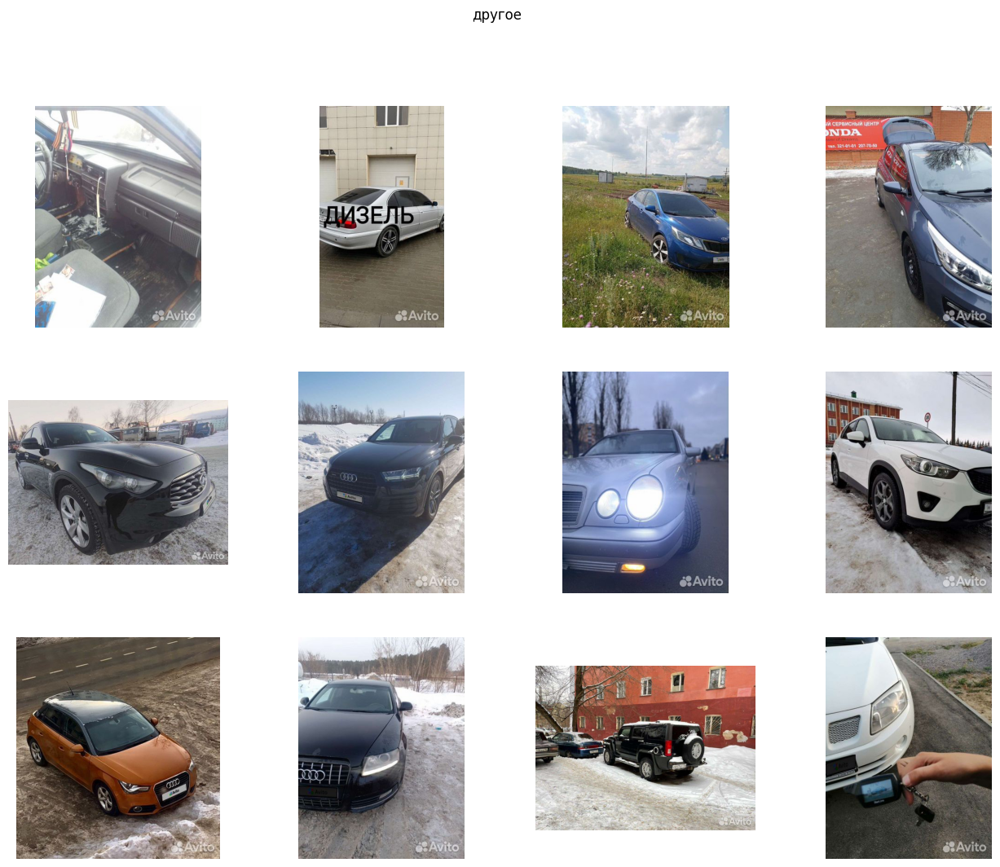

In [ ]:
plot_samples(annot, 'другое')